# TL Analysis

### Imports

In [2]:
import pandas as pd
import numpy as np
from IPython.display import Audio

from librispeech_clean.configuration import config
from leap_binder import get_data_subsets, get_input_audio

2024-03-18 15:54:54.122524: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
/Users/daniellebenbashat/Library/Caches/pypoetry/virtualenvs/librispeech-clean-DEO3A6BJ-py3.9/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/daniellebenbashat/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [3]:
# Functions

sr = config.get_parameter('sampling_rate')
subsets = ["training", "validation", "test"]

def play_record(subset_name, idx):
    
    data = responses[subsets.index(subset_name)]
    
    sample = get_input_audio(idx, data)
    
    # y is your audio signal, sr is the sample rate
    playback = Audio(sample, rate=sr)
    
    # To display the audio widget in Jupyter notebook
    display(playback)


def get_cluster_samples(alg_name: str = "clusters_kmeans", cluster_id: int = 0):
    return df[df[alg_name]==cluster_id]#['metadata.metadata_speech_dict_index']


### Load Data

We read Tensorleap .csv file output with analyzed metadata, clusters and insights into our model and data

In [4]:
path = "tl_analysis.csv"
df = pd.read_csv(path, delimiter="\t")

In [5]:
df.head()

,clusters_kmeans,distance_clusters_kmeans,subgroup_clusters_kmeans,representation_clusters_kmeans,representation_clusters_kmeans_score,clusters_bisecting,distance_clusters_bisecting,subgroup_clusters_bisecting,representation_clusters_bisecting,representation_clusters_bisecting_score,...,metrics.error_rate_metrics_word_insertion,metrics.error_rate_metrics_word_substitution,metrics.error_rate_metrics_word_hits,metrics.error_rate_metrics_char_hits,metrics.error_rate_metrics_char_deletion,metrics.error_rate_metrics_char_insertion,metrics.error_rate_metrics_char_substitution,duplication_ids,tl_sample_selection,tl_sample_removal
0,8,6.953235,41.0,1.0,0.077875,12,6.729349,54.0,1.0,0.265434,...,1.0,3.0,36.0,220.0,0.0,4.0,0.0,-1,0.0,0.0
1,8,7.588155,54.0,1.0,0.096891,13,7.765092,54.0,1.0,0.176911,...,0.0,2.0,28.0,136.0,0.0,2.0,0.0,-1,0.0,0.0
2,8,7.589172,31.0,1.0,0.052846,12,7.450746,8.0,1.0,0.124134,...,0.0,4.0,29.0,207.0,0.0,4.0,0.0,-1,0.0,0.0
3,2,6.399197,38.0,1.0,0.022144,3,6.297088,58.0,1.0,0.251010,...,0.0,4.0,35.0,210.0,0.0,2.0,3.0,-1,0.0,0.0
4,5,7.769834,56.0,1.0,0.168388,22,7.797266,46.0,1.0,0.152434,...,0.0,0.0,19.0,95.0,0.0,0.0,0.0,-1,0.0,0.0


In [6]:
[col for col in df.columns]

['clusters_kmeans',
 'distance_clusters_kmeans',
 'subgroup_clusters_kmeans',
 'representation_clusters_kmeans',
 'representation_clusters_kmeans_score',
 'clusters_bisecting',
 'distance_clusters_bisecting',
 'subgroup_clusters_bisecting',
 'representation_clusters_bisecting',
 'representation_clusters_bisecting_score',
 'clusters_estimated_bisecting',
 'distance_clusters_estimated_bisecting',
 'subgroup_clusters_estimated_bisecting',
 'representation_clusters_estimated_bisecting',
 'representation_clusters_estimated_bisecting_score',
 'metadata.metadata_speech_dict_index',
 'metadata.metadata_speech_dict_file_name',
 'metadata.metadata_speech_dict_speaker_id',
 'metadata.metadata_speech_dict_chapter_id',
 'metadata.metadata_speech_dict_signal_mean',
 'metadata.metadata_speech_dict_signal_std',
 'metadata.metadata_speech_dict_spectral_flatness_min',
 'metadata.metadata_speech_dict_spectral_flatness_max',
 'metadata.metadata_speech_dict_spectral_flatness_mean',
 'metadata.metadata_spee

Load the data

In [7]:
responses = get_data_subsets()
train, val, test = responses

# TL Clusters EDA

We plot the clusters TL labeled our data samples in unsupervised manner.


In [8]:
cluster_col = "clusters_kmeans" 
clusters_df = df.groupby(cluster_col)["metrics.ctc_loss"].agg(["count", "mean", "std", "min", "max"]).sort_values(by="mean", ascending=False)
clusters_df.style.background_gradient(subset=["count", "mean", "std", "min", "max"], cmap='coolwarm')

,count,mean,std,min,max
clusters_kmeans,,,,,
3,836,76.736176,61.388699,13.212029,664.637630
6,847,50.605595,24.415313,9.332496,198.397690
7,1126,48.151054,19.709316,8.173803,130.654240
4,695,44.530542,18.792398,7.524413,147.826310
5,639,44.025808,18.727743,8.743980,125.699520
0,956,40.582303,19.509115,0.545145,160.623920
11,1100,37.631841,18.257495,1.832332,145.016330
8,1939,33.476018,15.416802,3.316303,97.922970
9,1443,32.528934,15.324388,3.295954,176.560300


In [9]:
cluster_col = "clusters_kmeans" 

clusters_df = df.groupby([cluster_col, "metadata.metadata_records_gender"])[["metrics.ctc_loss", "metadata.metadata_records_minutes"]].agg(["count", "mean", "std", "min", "max"])#.sort_values(by="mean", ascending=False)
clusters_df.columns = ['_'.join(filter(None, col)).strip().replace("metadata.metadata_", "").replace("metrics.", "") for col in clusters_df.columns.values]
clusters_df.drop(columns="records_minutes_count", inplace=True)
clusters_df.rename(columns={"ctc_loss_count": "gender_count"},inplace=True)
clusters_df = clusters_df.reset_index()
clusters_df = clusters_df.sort_values(by=[cluster_col]).sort_values(by=["ctc_loss_mean"], ascending=False)
clusters_df.style.background_gradient(cmap='coolwarm')

,clusters_kmeans,metadata.metadata_records_gender,gender_count,ctc_loss_mean,ctc_loss_std,ctc_loss_min,ctc_loss_max,records_minutes_mean,records_minutes_std,records_minutes_min,records_minutes_max
7,3,M,310,80.370208,76.590207,13.741859,664.637630,11.237742,6.474468,8.000000,25.250000
6,3,F,526,74.594446,50.287531,13.212029,577.440370,11.600342,6.836817,8.000000,25.240000
12,6,F,384,53.574126,24.929416,12.539850,198.397690,13.127031,7.542872,8.000000,25.220000
14,7,F,578,50.335966,20.471280,12.421089,130.654240,12.534567,7.330997,8.000000,25.230000
13,6,M,463,48.143573,23.726953,9.332496,172.661470,12.594428,7.219749,8.000000,25.230000
15,7,M,548,45.846530,18.614701,8.173803,118.692245,12.669872,7.322398,5.440000,25.230000
8,4,F,548,45.790229,19.367224,7.524413,147.826310,12.664051,7.441155,8.000000,25.240000
10,5,F,582,44.097246,18.851605,8.743980,125.699520,14.929072,8.140613,8.000000,25.220000
11,5,M,57,43.296390,17.552913,11.957617,101.922806,14.464561,8.143477,8.020000,25.220000
0,0,F,47,41.715291,17.797455,7.156205,98.571010,14.187234,8.186725,8.000000,25.210000


Displaying the clusters with additional metadata: the gender and record time, we notice that cluster "3" has highest loss as for Female and as for Male samples. We also notice that these samples consist of lowest record time.


Let's play some of cluster "3" highest loss samples:

In [10]:
cols = ['metadata.metadata_speech_dict_index', 'dataset_state','metrics.ctc_loss', 'metadata.metadata_records_gender', 'metadata.metadata_records_minutes']
get_cluster_samples("clusters_kmeans", 3).sort_values(by="metrics.ctc_loss", ascending=False)[cols]

,metadata.metadata_speech_dict_index,dataset_state,metrics.ctc_loss,metadata.metadata_records_gender,metadata.metadata_records_minutes
11920,1256.0,validation,664.637630,M,8.01
14197,1739.0,test,577.440370,F,8.09
12409,2278.0,validation,535.392760,M,8.02
10070,518.0,validation,528.562500,M,8.04
13832,285.0,test,475.420000,F,8.03
...,...,...,...,...,...
13431,855.0,test,15.625354,F,8.07
13527,2416.0,test,14.775941,M,8.27
14514,1276.0,test,14.177857,M,8.32
13232,1623.0,test,13.741859,M,8.05


In [11]:
play_record("validation", 1256)
play_record("test", 1739)
play_record("validation", 2278)
play_record("validation", 518)

We hear that the samples with higest error from this cluster consist of one/two words solely.

Let's analyze cluster "2" that contains mostly Male samples:

,metadata.metadata_speech_dict_index,dataset_state,metrics.ctc_loss,metadata.metadata_records_gender,metadata.metadata_records_minutes
3364,5325.0,training,102.054270,M,25.20
1739,5466.0,training,91.488730,M,25.13
12068,1548.0,validation,89.134480,M,8.10
8635,3741.0,training,88.426476,M,25.18
5085,6792.0,training,88.312250,M,25.10
...,...,...,...,...,...
592,1730.0,training,7.013020,M,24.05
9610,1664.0,training,6.808848,M,25.10
14960,241.0,test,6.292516,M,8.27
9485,7266.0,training,6.208153,M,25.18


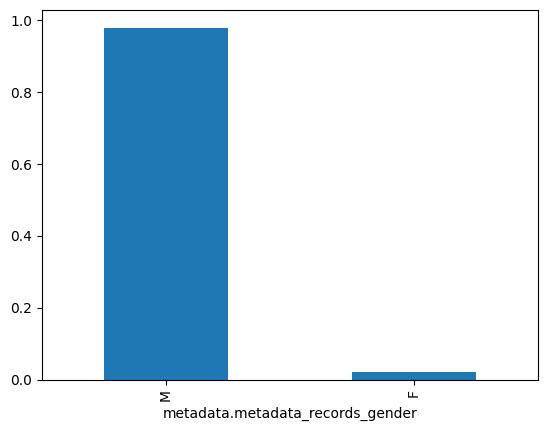

In [12]:
cols = ['metadata.metadata_speech_dict_index', 'dataset_state','metrics.ctc_loss', 'metadata.metadata_records_gender', 'metadata.metadata_records_minutes']
df_c = get_cluster_samples("clusters_kmeans", 2)
df_c.value_counts("metadata.metadata_records_gender", True).plot(kind="bar")
df_c.sort_values(by="metrics.ctc_loss", ascending=False)[cols]

In [13]:
df_c[df_c["metadata.metadata_records_gender"]=="F"].sort_values(by="metrics.ctc_loss", ascending=False)[cols]

,metadata.metadata_speech_dict_index,dataset_state,metrics.ctc_loss,metadata.metadata_records_gender,metadata.metadata_records_minutes
8958,9831.0,training,79.368996,F,25.20
2147,9051.0,training,61.937828,F,25.20
1211,8148.0,training,61.483200,F,25.16
2858,5268.0,training,60.921295,F,25.20
6679,7974.0,training,55.164394,F,25.17
9307,6996.0,training,53.638880,F,25.02
3171,4533.0,training,51.434036,F,25.20
7196,6450.0,training,50.405600,F,25.10
3784,9213.0,training,48.672894,F,25.16
692,9547.0,training,47.411007,F,25.17


In [14]:
# higest loss samples of Male records:
play_record("training", 5325)
play_record("training", 5466)

# higest loss samples of Female records:
play_record("training", 9831)
play_record("training", 9051)

We hear how the Female records sound more masculine than feminine.

In [17]:
df.sample(20)#[cols]

,clusters_kmeans,distance_clusters_kmeans,subgroup_clusters_kmeans,representation_clusters_kmeans,representation_clusters_kmeans_score,clusters_bisecting,distance_clusters_bisecting,subgroup_clusters_bisecting,representation_clusters_bisecting,representation_clusters_bisecting_score,...,metrics.error_rate_metrics_word_insertion,metrics.error_rate_metrics_word_substitution,metrics.error_rate_metrics_word_hits,metrics.error_rate_metrics_char_hits,metrics.error_rate_metrics_char_deletion,metrics.error_rate_metrics_char_insertion,metrics.error_rate_metrics_char_substitution,duplication_ids,tl_sample_selection,tl_sample_removal
12929,9,5.593048,40.0,0.0,0.039174,11,5.050324,51.0,1.0,0.075779,...,0.0,7.0,33.0,202.0,0.0,7.0,0.0,-1,0.0,1.0
5939,8,6.400073,0.0,1.0,0.364061,13,6.517919,74.0,1.0,0.387455,...,0.0,4.0,30.0,198.0,2.0,3.0,1.0,-1,0.0,0.0
11462,3,8.023089,81.0,1.0,0.052589,19,8.363927,4.0,1.0,0.052589,...,0.0,0.0,0.0,0.0,16.0,0.0,0.0,-1,1.0,0.0
13952,7,4.159867,50.0,1.0,0.051427,18,4.300322,63.0,1.0,0.232916,...,0.0,3.0,7.0,38.0,8.0,0.0,3.0,-1,1.0,0.0
11813,4,7.806478,1.0,1.0,0.697271,23,8.190571,22.0,1.0,0.198185,...,0.0,2.0,16.0,101.0,1.0,1.0,0.0,-1,1.0,0.0
7780,7,6.391636,16.0,1.0,0.046772,18,6.705210,4.0,1.0,0.318425,...,0.0,2.0,7.0,40.0,0.0,1.0,2.0,-1,0.0,0.0
5027,2,7.300570,63.0,1.0,0.067691,4,6.829414,7.0,1.0,0.198899,...,0.0,4.0,31.0,167.0,0.0,4.0,0.0,-1,0.0,0.0
6620,5,6.845138,55.0,1.0,0.126123,22,7.194271,4.0,1.0,0.248760,...,0.0,1.0,21.0,109.0,0.0,1.0,0.0,-1,0.0,0.0
8132,2,6.375792,54.0,1.0,0.050148,3,6.338055,56.0,1.0,0.181619,...,1.0,5.0,36.0,232.0,1.0,5.0,1.0,-1,0.0,0.0
4164,10,7.132847,11.0,1.0,0.176087,3,6.344511,31.0,1.0,0.081772,...,0.0,6.0,42.0,249.0,1.0,5.0,1.0,-1,0.0,0.0


In [16]:
def play_record(subset_name, idx):
    subsets = ["training", "validation", "test"]
    data = responses[subsets.index(subset_name)]
    
    sample = get_input_audio(idx, data)
    
    # y is your audio signal, sr is the sample rate
    playback = Audio(sample, rate=sr)
    
    # To display the audio widget in Jupyter notebook
    display(playback)


idx = 569
idx = 2446
idx = 1623
idx = 1256
idx = 855
idx = 1855
idx = 2142
idx = 2465
idx = 2446
idx = 53
idx = 3167
subset = "validation"
subset = "training"
# subset_name = "test"
play_record(subset, idx)